In [4]:
!pip install pimms-learn

  Using cached seaborn-0.12.2-py3-none-any.whl.metadata (5.4 kB)
Using cached seaborn-0.12.2-py3-none-any.whl (293 kB)
  Attempting uninstall: seaborn
    Found existing installation: seaborn 0.13.2
    Uninstalling seaborn-0.13.2:
      Successfully uninstalled seaborn-0.13.2


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
scanpy 1.10.1 requires seaborn>=0.13, but you have seaborn 0.12.2 which is incompatible.


In [ ]:
import pimmslearn

c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


epoch,train_loss,valid_loss,time
0,43473.777344,None,00:00
1,42871.238281,None,00:00
2,42225.726562,None,00:00
3,41547.500000,None,00:00
4,40551.652344,None,00:00
5,39289.980469,None,00:00
6,37739.546875,None,00:00
7,36067.929688,None,00:00
8,33968.316406,None,00:00
9,31803.021484,None,00:00


c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")


suggested_lr.valley = 0.00363


epoch,train_loss,valid_loss,time
0,8.672514,None,00:00
1,8.095406,None,00:00
2,5.323771,None,00:00
3,2.742993,None,00:00
4,1.580006,None,00:00
5,1.023429,None,00:00
6,0.722109,None,00:00
7,0.568118,None,00:00
8,0.489233,None,00:00
9,0.449404,None,00:00


c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py3

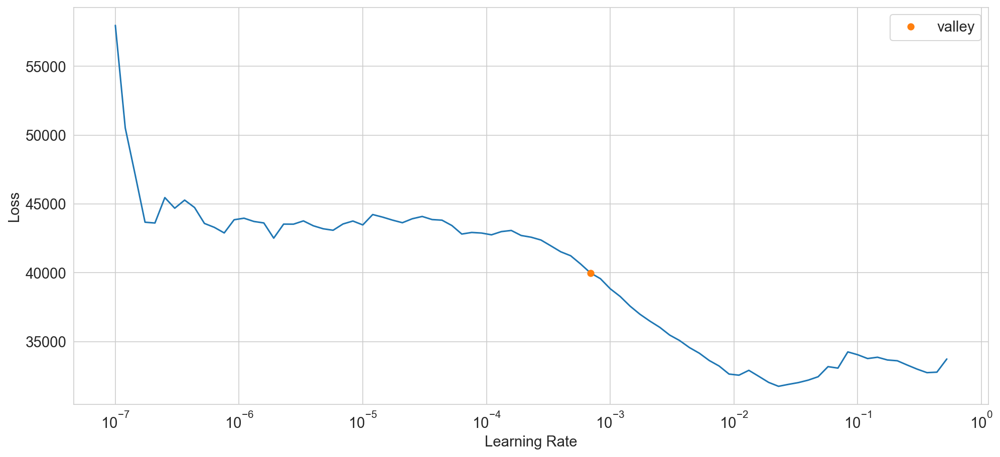

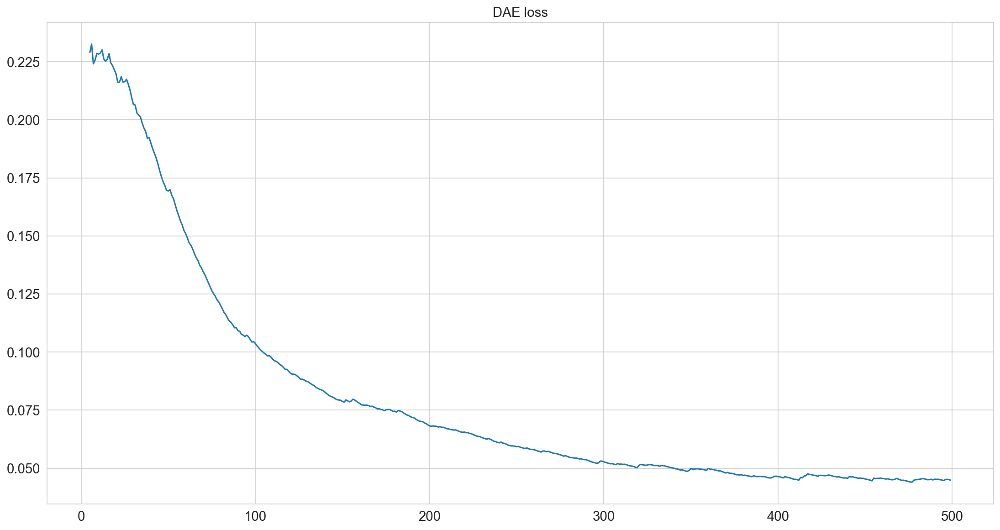

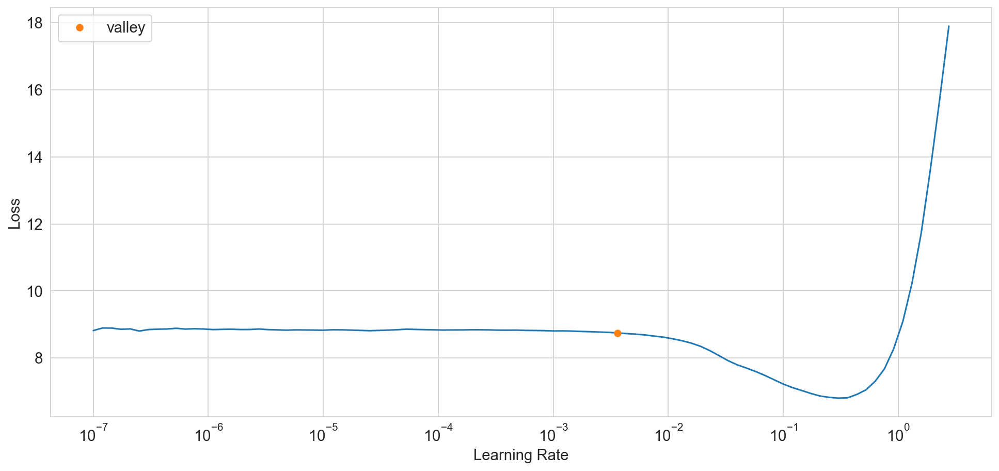

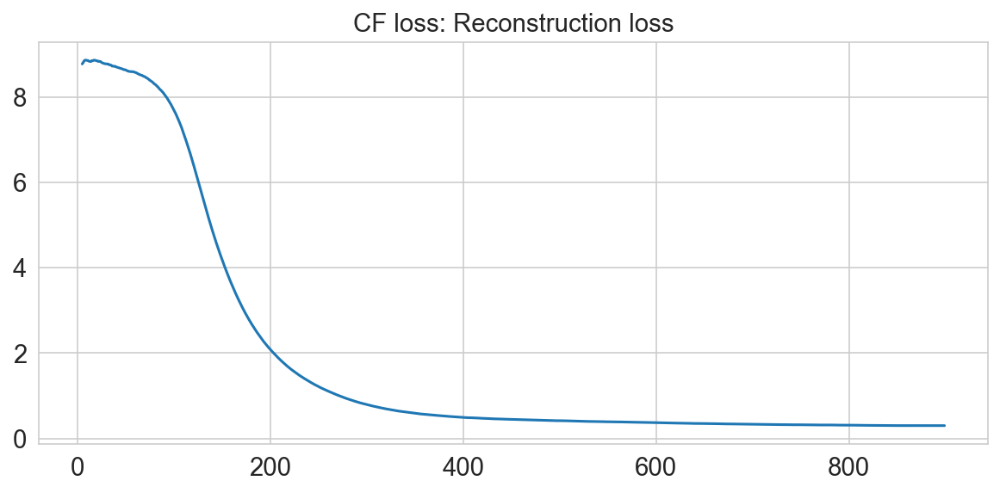

In [1]:
import numpy as np
import pandas as pd
from pimmslearn.sklearn.ae_transformer import AETransformer
from pimmslearn.sklearn.cf_transformer import CollaborativeFilteringTransformer

fn_intensities = ('https://raw.githubusercontent.com/RasmussenLab/pimms/main/'
                  'project/data/dev_datasets/HeLa_6070/protein_groups_wide_N50.csv')
index_name = 'Sample ID'
column_name = 'protein group'
value_name = 'intensity'

df = pd.read_csv(fn_intensities, index_col=0)
df = np.log2(df + 1)

df.index.name = index_name  # already set
df.columns.name = column_name  # not set due to csv disk file format

# df # see details below to see a preview of the DataFrame

# use the Denoising or Variational Autoencoder
model = AETransformer(
    model='DAE', # or 'VAE'
    hidden_layers=[512,],
    latent_dim=50, # dimension of joint sample and item embedding
    batch_size=10,
)
model.fit(df,
          cuda=False,
          epochs_max=100,
          )
df_imputed = model.transform(df)

# or use the collaborative filtering model
series = df.stack()
series.name = value_name  # ! important
model = CollaborativeFilteringTransformer(
    target_column=value_name,
    sample_column=index_name,
    item_column=column_name,
    n_factors=30, # dimension of separate sample and item embedding
    batch_size = 4096
)
model.fit(series, cuda=False, epochs_max=20)
df_imputed = model.transform(series).unstack()

In [3]:
df

protein group,AAAS,AACS,AAMDC,AAMP,AAR2,AARS,AARS2,AASDHPPT,AATF,ABCB10,...,ZNHIT2,ZNRF2,ZPR1,ZRANB2,ZW10,ZWILCH,ZWINT,ZYX,hCG_2014768;TMA7,pk;ZAK
Sample ID,,,,,,,,,,,,,,,,,,,,,
2019_12_18_14_35_Q-Exactive-HF-X-Orbitrap_6070,28.349,26.133,NaN,26.777,27.248,32.195,27.153,27.872,28.603,26.110,...,25.581,24.468,28.309,28.831,28.851,NaN,24.379,29.427,28.080,22.879
2019_12_19_19_48_Q-Exactive-HF-X-Orbitrap_6070,27.657,25.019,24.236,26.271,27.211,31.979,26.530,28.191,27.942,25.735,...,NaN,NaN,28.133,27.267,28.243,NaN,NaN,28.081,NaN,NaN
2019_12_20_14_15_Q-Exactive-HF-X-Orbitrap_6070,28.352,23.740,NaN,27.098,27.377,32.885,27.515,28.476,28.771,26.787,...,25.184,NaN,28.968,27.322,29.388,NaN,25.803,29.525,NaN,NaN
2019_12_27_12_29_Q-Exactive-HF-X-Orbitrap_6070,26.826,NaN,NaN,26.256,NaN,31.926,26.157,27.635,27.851,25.346,...,NaN,23.586,27.636,27.278,28.076,NaN,24.688,28.783,NaN,NaN
2019_12_29_15_06_Q-Exactive-HF-X-Orbitrap_6070,27.404,26.948,23.864,26.982,26.520,31.844,25.342,27.416,27.474,NaN,...,24.591,NaN,25.838,29.326,27.491,26.406,NaN,30.422,NaN,26.939
2019_12_29_18_18_Q-Exactive-HF-X-Orbitrap_6070,27.891,26.481,26.348,27.849,26.917,32.274,NaN,27.404,28.081,NaN,...,24.849,NaN,26.750,29.652,27.635,26.037,25.002,30.928,NaN,27.088
2020_01_02_17_38_Q-Exactive-HF-X-Orbitrap_6070,25.498,NaN,NaN,NaN,NaN,30.226,NaN,23.801,25.130,NaN,...,NaN,NaN,NaN,27.518,25.148,NaN,NaN,28.465,28.902,NaN
2020_01_03_11_17_Q-Exactive-HF-X-Orbitrap_6070,27.352,NaN,24.433,25.275,24.846,30.979,NaN,24.893,25.324,NaN,...,NaN,NaN,24.336,27.579,26.528,NaN,NaN,29.726,28.933,NaN
2020_01_03_16_58_Q-Exactive-HF-X-Orbitrap_6070,27.620,25.624,23.520,27.136,25.971,31.415,25.360,25.119,25.750,NaN,...,24.982,24.940,25.198,29.245,27.331,25.069,NaN,30.952,NaN,27.086


In [5]:
df_imputed

protein group,AAAS,AACS,AAMDC,AAMP,AAR2,AARS,AARS2,AASDHPPT,AATF,ABCB10,...,ZNHIT2,ZNRF2,ZPR1,ZRANB2,ZW10,ZWILCH,ZWINT,ZYX,hCG_2014768;TMA7,pk;ZAK
Sample ID,,,,,,,,,,,,,,,,,,,,,
2019_12_18_14_35_Q-Exactive-HF-X-Orbitrap_6070,28.349,26.133,24.473,26.777,27.248,32.195,27.153,27.872,28.603,26.110,...,25.581,24.468,28.309,28.831,28.851,23.832,24.379,29.427,28.080,22.879
2019_12_19_19_48_Q-Exactive-HF-X-Orbitrap_6070,27.657,25.019,24.236,26.271,27.211,31.979,26.530,28.191,27.942,25.735,...,25.179,24.045,28.133,27.267,28.243,23.226,25.420,28.081,27.521,23.298
2019_12_20_14_15_Q-Exactive-HF-X-Orbitrap_6070,28.352,23.740,24.767,27.098,27.377,32.885,27.515,28.476,28.771,26.787,...,25.184,24.734,28.968,27.322,29.388,24.068,25.803,29.525,28.054,23.757
2019_12_27_12_29_Q-Exactive-HF-X-Orbitrap_6070,26.826,25.195,24.088,26.256,26.108,31.926,26.157,27.635,27.851,25.346,...,24.896,23.586,27.636,27.278,28.076,23.035,24.688,28.783,27.364,23.207
2019_12_29_15_06_Q-Exactive-HF-X-Orbitrap_6070,27.404,26.948,23.864,26.982,26.520,31.844,25.342,27.416,27.474,26.752,...,24.591,25.694,25.838,29.326,27.491,26.406,25.172,30.422,30.037,26.939
2019_12_29_18_18_Q-Exactive-HF-X-Orbitrap_6070,27.891,26.481,26.348,27.849,26.917,32.274,25.783,27.404,28.081,27.102,...,24.849,25.998,26.750,29.652,27.635,26.037,25.002,30.928,30.342,27.088
2020_01_02_17_38_Q-Exactive-HF-X-Orbitrap_6070,25.498,24.523,23.216,25.610,24.919,30.226,23.375,23.801,25.130,24.722,...,23.791,24.216,24.119,27.518,25.148,23.606,23.679,28.465,28.902,24.732
2020_01_03_11_17_Q-Exactive-HF-X-Orbitrap_6070,27.352,25.102,24.433,25.275,24.846,30.979,24.290,24.893,25.324,25.481,...,24.861,24.599,24.336,27.579,26.528,23.794,24.427,29.726,28.933,25.523
2020_01_03_16_58_Q-Exactive-HF-X-Orbitrap_6070,27.620,25.624,23.520,27.136,25.971,31.415,25.360,25.119,25.750,26.245,...,24.982,24.940,25.198,29.245,27.331,25.069,24.832,30.952,29.785,27.086


# own implementation

In [26]:
from scpviz.pAnnData import pAnnData

obs_columns = ['user', 'amount', 'amount', 'date', 'ms', 'acquisition', 'acq2', 'gradient', 'rep']

pdata = pAnnData.import_data(source_type='diann', report_file = 'test_diann.tsv', obs_columns=obs_columns)


🧭 [USER] Importing data of type [diann]
--------------------------
Starting import [DIA-NN]

Source file: test_diann.tsv
Number of files: 5
Proteins: 3724
Peptides: 16947

ℹ️ 2 proteins with missing gene names.
     🌐 [API] Querying UniProt for batch 1/1 (2 proteins) [fields: accession, gene_primary]
     ✅ Retrieved UniProt metadata for 2 entries.
     ⚠️ [WARN] 2 gene name(s) still missing. Assigned as 'UNKNOWN_<accession>' for:
         P0DOX6, Q6ZSR9
     💡 Tip: You can update these using `pdata.update_identifier_maps({'GENE': 'ACCESSION'}, on='protein', direction='reverse', overwrite=True)`

     ℹ️ [INFO] Using sample-specific q-values for 'prot' significance annotation.
     ℹ️ [INFO] Using sample-specific q-values for 'pep' significance annotation.

ℹ️ RS matrix: (3724, 16947) (proteins × peptides), sparsity: 99.97%
   - Proteins with ≥2 *unique* linked peptides: 2500/3724
   - Peptides linked to ≥2 proteins: 0/16947
   - Mean peptides per protein: 4.55
   - Mean proteins per p

G:\Users\srpang\Dropbox (Personal)\4. Caltech Work\Research\Chou-Roukes Group\scviz_git\src\scpviz\utils.py:1189: RuntimeWarning: [standardize_uniprot_columns] Missing expected UniProt columns: xref_string, organism_id
  batch_df = standardize_uniprot_columns(batch_df)
G:\Users\srpang\Dropbox (Personal)\4. Caltech Work\Research\Chou-Roukes Group\scviz_git\src\scpviz\pAnnData\identifier.py:311: RuntimeWarning: [standardize_uniprot_columns] Missing expected UniProt columns: xref_string, organism_id
  df = utils.standardize_uniprot_columns(df)


In [27]:
from scipy import sparse

method='pimms_dae'
on='protein'
layer='X'

adata = pdata.prot if on == 'protein' else self.pep
if layer != "X" and layer not in adata.layers:
    raise ValueError(f"Layer '{layer}' not found in .{on}.")

impute_data = adata.layers[layer] if layer != "X" else adata.X
was_sparse = sparse.issparse(impute_data)
impute_data = impute_data.toarray() if was_sparse else impute_data.copy()
original_data = impute_data.copy()

layer_name = f"X_impute_{method}"

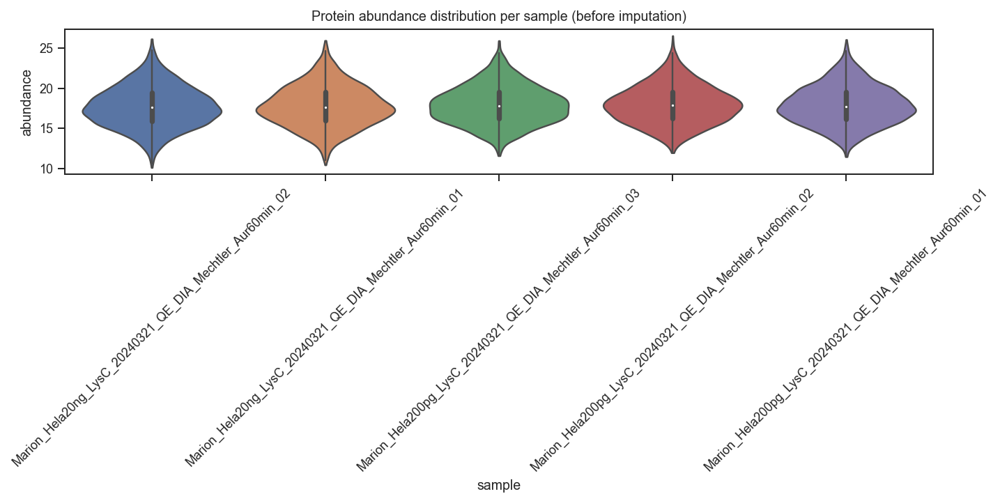

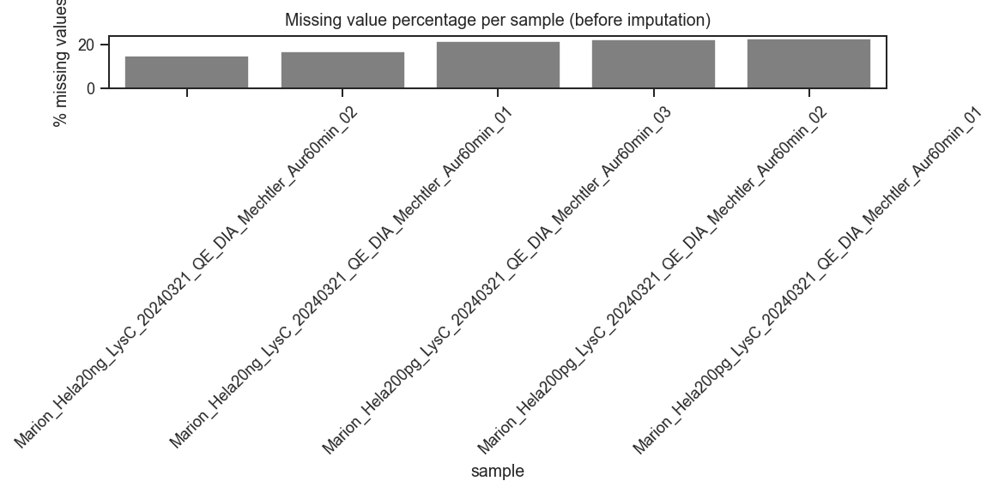

In [28]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df_before = pd.DataFrame(impute_data, index=adata.obs_names,columns=adata.var_names)

df_log = np.log2(df_before + 1)

# melt into long-format
long_before = df_log.reset_index().melt(
    id_vars="index",
    var_name="protein",
    value_name="abundance"
)
long_before.rename(columns={"index": "sample"}, inplace=True)

plt.figure(figsize=(10, 5))
sns.violinplot(
    data=long_before,
    x="sample",
    y="abundance",
    inner="box",
    cut=0,
    scale="width"
)
plt.xticks(rotation=45)
plt.title("Protein abundance distribution per sample (before imputation)")
plt.tight_layout()
plt.show()

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# impute_data is (samples × proteins)
missing_pct = np.isnan(impute_data).mean(axis=1) * 100  # % missing per sample

df_missing = pd.DataFrame({
    "sample": adata.obs_names,
    "missing_pct": missing_pct
})

plt.figure(figsize=(8, 4))
sns.barplot(
    data=df_missing,
    x="sample",
    y="missing_pct",
    color="gray"
)
plt.xticks(rotation=45)
plt.ylabel("% missing values")
plt.title("Missing value percentage per sample (before imputation)")
plt.tight_layout()
plt.show()


Running PIMMS Collaborative Filtering…


c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py3

suggested_lr.valley = 0.00631


epoch,train_loss,valid_loss,time
0,6.487507,None,00:00
1,6.487295,None,00:00
2,6.452458,None,00:00
3,6.402897,None,00:00
4,6.271526,None,00:00
5,6.077388,None,00:00
6,5.831241,None,00:00
7,5.537320,None,00:00
8,5.189878,None,00:00
9,4.810558,None,00:00


c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py311\Lib\site-packages\fastprogress\fastprogress.py:73: UserWarning: Your generator is empty.
  warn("Your generator is empty.")
c:\Users\srpang\anaconda3\envs\py3

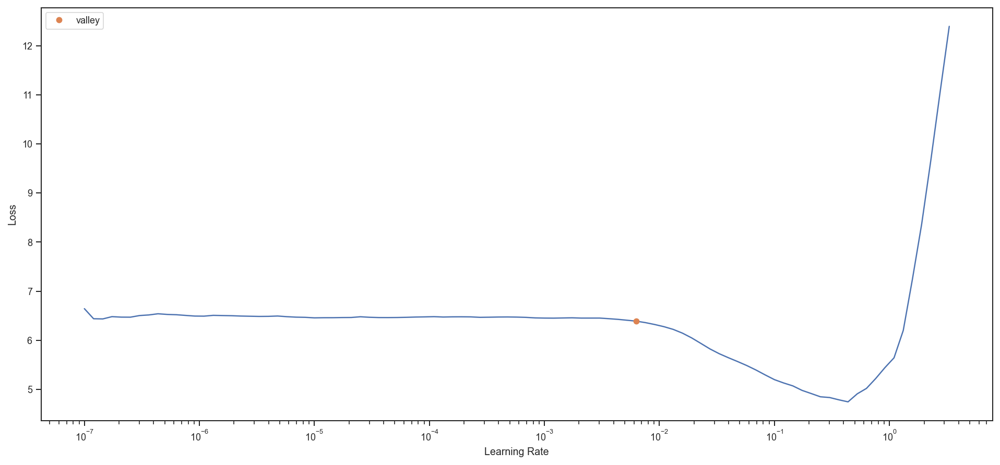

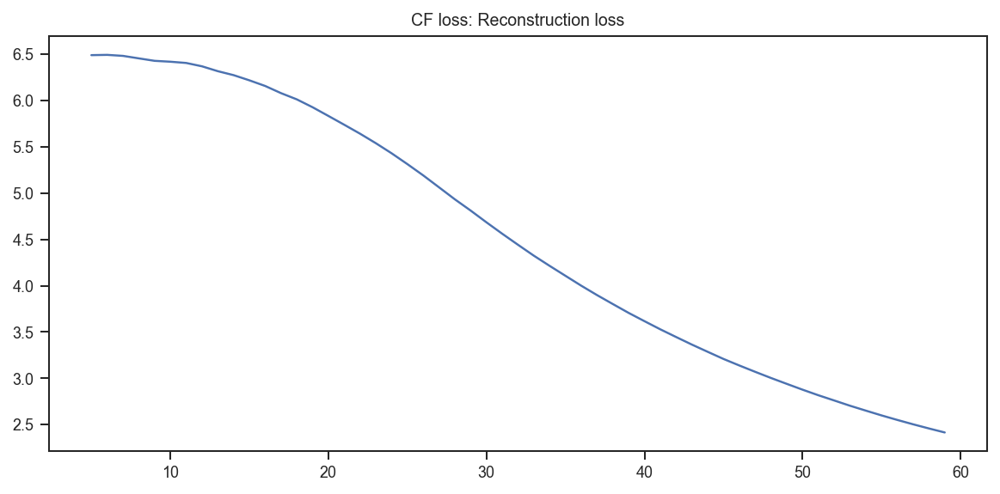

In [34]:
df = pd.DataFrame(
    impute_data,
    index=adata.obs_names,
    columns=adata.var_names
)

df = np.log2(df + 1)

method = 'pimms_cf'

if method in {"pimms_dae", "pimms_vae"}:
    model_type = "DAE" if method == "pimms_dae" else "VAE"
    model = AETransformer(
        model=model_type,
        hidden_layers=[512,],
        latent_dim=50, # dimension of joint sample and item embedding
        batch_size=10,
    )

    print(f" Running PIMMS {model_type} imputation…")
    model.fit(df,
            cuda=False,
            epochs_max=100)
    df_imputed = model.transform(df)

else:  # pimms_cf
    index_name = "Sample ID"
    column_name = "protein group"
    value_name = "intensity"

    df.index.name = index_name       # "Sample ID"
    df.columns.name = column_name    # "protein group"

    series = df.stack()
    series.name = value_name

    model = CollaborativeFilteringTransformer(
        target_column=value_name,
        sample_column=index_name,
        item_column=column_name,
        n_factors=30,
        batch_size=4096
    )

    print(f"Running PIMMS Collaborative Filtering…")
    model.fit(series,
            cuda=False,
            epochs_max=20)
    df_imputed = model.transform(series).unstack()

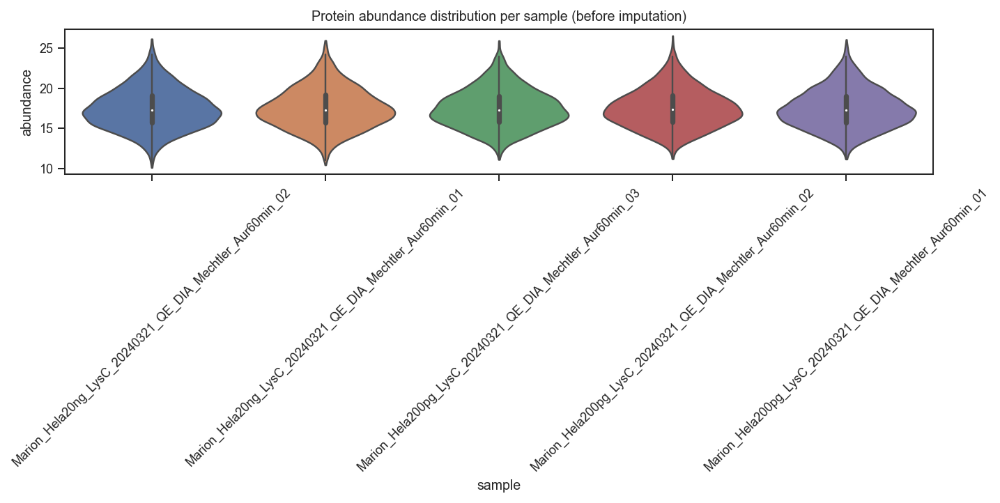

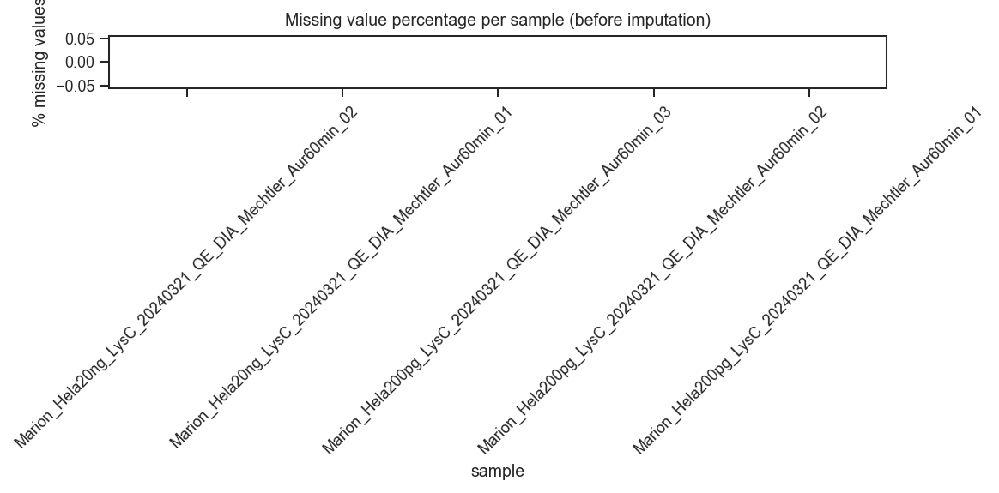

In [30]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# melt into long-format
long_before = df_imputed.reset_index().melt(
    id_vars="index",
    var_name="protein",
    value_name="abundance"
)
long_before.rename(columns={"index": "sample"}, inplace=True)

plt.figure(figsize=(10, 5))
sns.violinplot(
    data=long_before,
    x="sample",
    y="abundance",
    inner="box",
    cut=0,
    scale="width"
)
plt.xticks(rotation=45)
plt.title("Protein abundance distribution per sample (before imputation)")
plt.tight_layout()
plt.show()

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# impute_data is (samples × proteins)
missing_pct = np.isnan(df_imputed).mean(axis=1) * 100  # % missing per sample

df_missing = pd.DataFrame({
    "sample": adata.obs_names,
    "missing_pct": missing_pct
})

plt.figure(figsize=(8, 4))
sns.barplot(
    data=df_missing,
    x="sample",
    y="missing_pct",
    color="gray"
)
plt.xticks(rotation=45)
plt.ylabel("% missing values")
plt.title("Missing value percentage per sample (before imputation)")
plt.tight_layout()
plt.show()


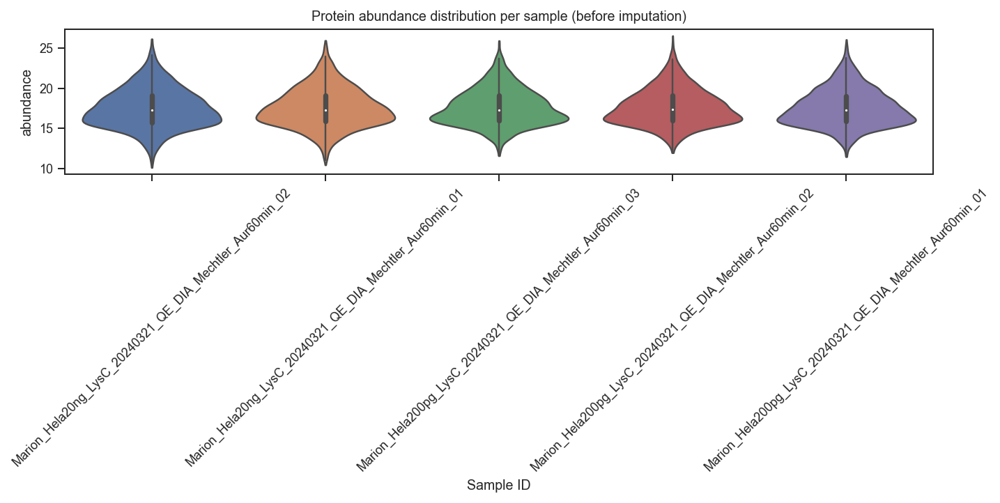

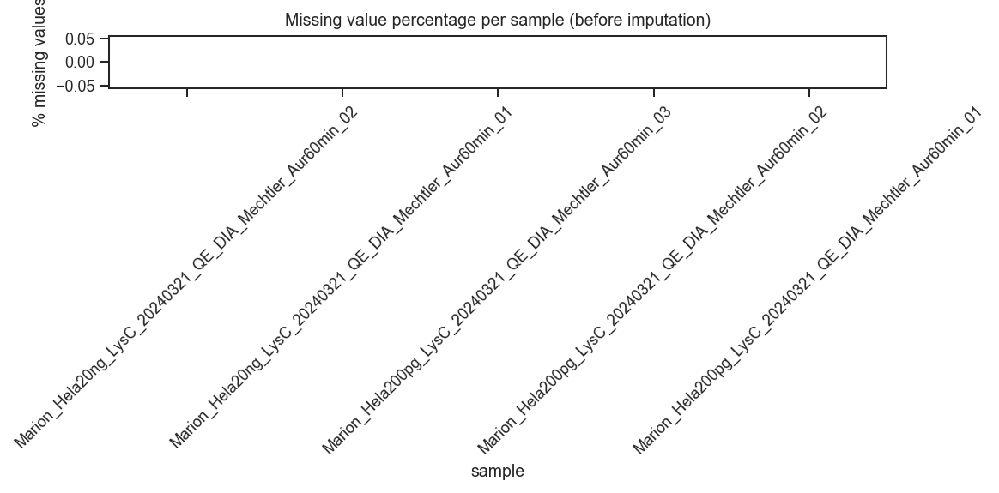

In [41]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# melt into long-format
long_before = df_imputed.reset_index().melt(
    id_vars="Sample ID",
    var_name="protein",
    value_name="abundance"
)
long_before.rename(columns={"index": "Sample ID"}, inplace=True)

plt.figure(figsize=(10, 5))
sns.violinplot(
    data=long_before,
    x="Sample ID",
    y="abundance",
    inner="box",
    cut=0,
    scale="width"
)
plt.xticks(rotation=45)
plt.title("Protein abundance distribution per sample (before imputation)")
plt.tight_layout()
plt.show()

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# impute_data is (samples × proteins)
missing_pct = np.isnan(df_imputed).mean(axis=1) * 100  # % missing per sample

df_missing = pd.DataFrame({
    "sample": adata.obs_names,
    "missing_pct": missing_pct
})

plt.figure(figsize=(8, 4))
sns.barplot(
    data=df_missing,
    x="sample",
    y="missing_pct",
    color="gray"
)
plt.xticks(rotation=45)
plt.ylabel("% missing values")
plt.title("Missing value percentage per sample (before imputation)")
plt.tight_layout()
plt.show()


## check stack behaviour

In [42]:
df = pd.DataFrame([[1, np.nan, 3], [4, 5, np.nan]])
df.stack()


0  0   1.000
   2   3.000
1  0   4.000
   1   5.000
dtype: float64

In [43]:
df.stack(dropna=False)


C:\Users\srpang\AppData\Local\Temp\ipykernel_49664\2049356705.py:1: FutureWarning: The previous implementation of stack is deprecated and will be removed in a future version of pandas. See the What's New notes for pandas 2.1.0 for details. Specify future_stack=True to adopt the new implementation and silence this warning.
  df.stack(dropna=False)


0  0   1.000
   1     NaN
   2   3.000
1  0   4.000
   1   5.000
   2     NaN
dtype: float64